# 3D Gaussian Splatting для реконструкции сцен
В этом проекте мы обучили модель 3D Gaussian Splatting для задачи novel view synthesis — генерации новых ракурсов 3D-сцены по набору 2D-изображений.

автор: Потапов Иван


In [ ]:
!pip install --upgrade pip -q
!pip install nerfstudio -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 35.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.71.2 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 3.20.3 which is incompatible.
google-cloud-bigquery-connection 1.21.0 requires protobuf<8.0.0,>=4.25.8, but you have protobuf 3.20.3 which is incompatible.
grpc-google-iam-v1 0.14.4 requires protobuf<8.0.0,>=4.25.8, but you have protobuf 3.20.3 which is incompatible.
proto-plus 1.27.2 requires protobuf<8.0.0,>=4.25.8, but you have protobuf 3.20.3 which is

In [ ]:
!ns-download-data --help

2026-05-11 19:23:19.149115: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
usage: /usr/local/bin/ns-download-data [-h] {blender,sitcoms3d,nerfstudio,record3d,dnerf,phototourism,sdfstudio,nerfosr,mill19,eyefultower}

╭─ options ────────────────────────────────────────────────────────────────────╮
│ -h, --help        show this help message and exit                            │
╰──────────────────────────────────────────────────────────────────────────────╯
╭─ subcommands ────────────────────────────────────────────────────────────────╮
│ (required)                                                                   │
│   • blender       Download the blender dataset.                              │
│   • sitcoms3d     Download the sitcoms3D dataset.  

In [ ]:
!python -c "import nerfstudio; print('nerfstudio imported ok')"

nerfstudio imported ok


In [ ]:
%cd /content

!ns-download-data nerfstudio --capture-name=poster --save-dir /content/data

/content
2026-05-11 19:23:27.240800: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/gdown/download.py", line 273, in download
    url = get_url_from_gdrive_confirmation(res.text)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/gdown/download.py", line 55, in get_url_from_gdrive_confirmation
    raise FileURLRetrievalError(
gdown.exceptions.FileURLRetrievalError: Cannot retrieve the public link of the file. You may need to change the permission to 'Anyone with the link', or have had many accesses. Check FAQ in https://github.com/wkentaro/gdown?tab=readme-ov-file#faq.

During handling of the above exception, anoth

In [ ]:
!find /content/data/nerfstudio/poster -maxdepth 2 -type f | head -20

In [ ]:
import os
import glob
import matplotlib.pyplot as plt
from PIL import Image

image_paths = sorted(glob.glob("/content/data/nerfstudio/poster/images/*"))

print("Количество изображений:", len(image_paths))
print("Первые файлы:")
for p in image_paths[:5]:
    print(p)

plt.figure(figsize=(15, 8))

for i, path in enumerate(image_paths[:8]):
    img = Image.open(path)
    plt.subplot(2, 4, i + 1)
    plt.imshow(img)
    plt.title(os.path.basename(path))
    plt.axis("off")

plt.tight_layout()
plt.show()

Количество изображений: 0
Первые файлы:


<Figure size 1500x800 with 0 Axes>

In [ ]:
!find /content/data -maxdepth 5 -type d

/content/data
/content/data/nerfstudio
/content/data/nerfstudio/poster
/content/data/nerfstudio/.temp_poster


In [ ]:
!find /content/data -maxdepth 5 -type f | head -50

In [ ]:
!ls -lah /content/data

total 12K
drwxr-xr-x 3 root root 4.0K May 11 19:23 .
drwxr-xr-x 1 root root 4.0K May 11 19:23 ..
drwxr-xr-x 4 root root 4.0K May 11 19:23 nerfstudio


In [ ]:
!rm -rf /content/data/nerfstudio/poster
!rm -rf /content/data/nerfstudio/.temp_poster

In [ ]:
%cd /content

!ns-download-data nerfstudio --capture-name=poster --save-dir /content/data

/content
2026-05-11 19:23:32.800370: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/gdown/download.py", line 273, in download
    url = get_url_from_gdrive_confirmation(res.text)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/gdown/download.py", line 55, in get_url_from_gdrive_confirmation
    raise FileURLRetrievalError(
gdown.exceptions.FileURLRetrievalError: Cannot retrieve the public link of the file. You may need to change the permission to 'Anyone with the link', or have had many accesses. Check FAQ in https://github.com/wkentaro/gdown?tab=readme-ov-file#faq.

During handling of the above exception, anoth

In [ ]:
!find /content/data/nerfstudio/poster -maxdepth 3 -type f | head -30

In [ ]:
!du -sh /content/data/nerfstudio/poster

4.0K	/content/data/nerfstudio/poster


In [ ]:
!du -sh /content/data/nerfstudio/poster

4.0K	/content/data/nerfstudio/poster


In [ ]:
from huggingface_hub import snapshot_download

local_dir = "/content/data/nerfstudio/poster"

snapshot_download(
    repo_id="nerfstudioteam/datasets",
    repo_type="dataset",
    allow_patterns="poster/**",
    local_dir="/content/data/nerfstudio_hf",
    local_dir_use_symlinks=False,
)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `snapshot_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Fetching ... files: 0it [00:00, ?it/s]

'/content/data/nerfstudio_hf'

In [ ]:
!find /content/data/nerfstudio_hf -maxdepth 4 -type f | head -50

/content/data/nerfstudio_hf/poster/images/frame_00071.png
/content/data/nerfstudio_hf/poster/images/frame_00114.png
/content/data/nerfstudio_hf/poster/images/frame_00217.png
/content/data/nerfstudio_hf/poster/images/frame_00029.png
/content/data/nerfstudio_hf/poster/images/frame_00011.png
/content/data/nerfstudio_hf/poster/images/frame_00062.png
/content/data/nerfstudio_hf/poster/images/frame_00074.png
/content/data/nerfstudio_hf/poster/images/frame_00201.png
/content/data/nerfstudio_hf/poster/images/frame_00001.png
/content/data/nerfstudio_hf/poster/images/frame_00117.png
/content/data/nerfstudio_hf/poster/images/frame_00173.png
/content/data/nerfstudio_hf/poster/images/frame_00158.png
/content/data/nerfstudio_hf/poster/images/frame_00099.png
/content/data/nerfstudio_hf/poster/images/frame_00005.png
/content/data/nerfstudio_hf/poster/images/frame_00206.png
/content/data/nerfstudio_hf/poster/images/frame_00164.png
/content/data/nerfstudio_hf/poster/images/frame_00203.png
/content/data/

In [ ]:
!du -sh /content/data/nerfstudio_hf/poster

363M	/content/data/nerfstudio_hf/poster


In [ ]:
!find /content/data/nerfstudio_hf/poster -type f | grep -E "\.(jpg|jpeg|png)$" | head -20

/content/data/nerfstudio_hf/poster/images/frame_00071.png
/content/data/nerfstudio_hf/poster/images/frame_00114.png
/content/data/nerfstudio_hf/poster/images/frame_00217.png
/content/data/nerfstudio_hf/poster/images/frame_00029.png
/content/data/nerfstudio_hf/poster/images/frame_00011.png
/content/data/nerfstudio_hf/poster/images/frame_00062.png
/content/data/nerfstudio_hf/poster/images/frame_00074.png
/content/data/nerfstudio_hf/poster/images/frame_00201.png
/content/data/nerfstudio_hf/poster/images/frame_00001.png
/content/data/nerfstudio_hf/poster/images/frame_00117.png
/content/data/nerfstudio_hf/poster/images/frame_00173.png
/content/data/nerfstudio_hf/poster/images/frame_00158.png
/content/data/nerfstudio_hf/poster/images/frame_00099.png
/content/data/nerfstudio_hf/poster/images/frame_00005.png
/content/data/nerfstudio_hf/poster/images/frame_00206.png
/content/data/nerfstudio_hf/poster/images/frame_00164.png
/content/data/nerfstudio_hf/poster/images/frame_00203.png
/content/data/

Количество изображений: 100
Первые 5 файлов:
/content/data/nerfstudio_hf/poster/images_4/frame_00001.png
/content/data/nerfstudio_hf/poster/images_4/frame_00003.png
/content/data/nerfstudio_hf/poster/images_4/frame_00004.png
/content/data/nerfstudio_hf/poster/images_4/frame_00005.png
/content/data/nerfstudio_hf/poster/images_4/frame_00006.png


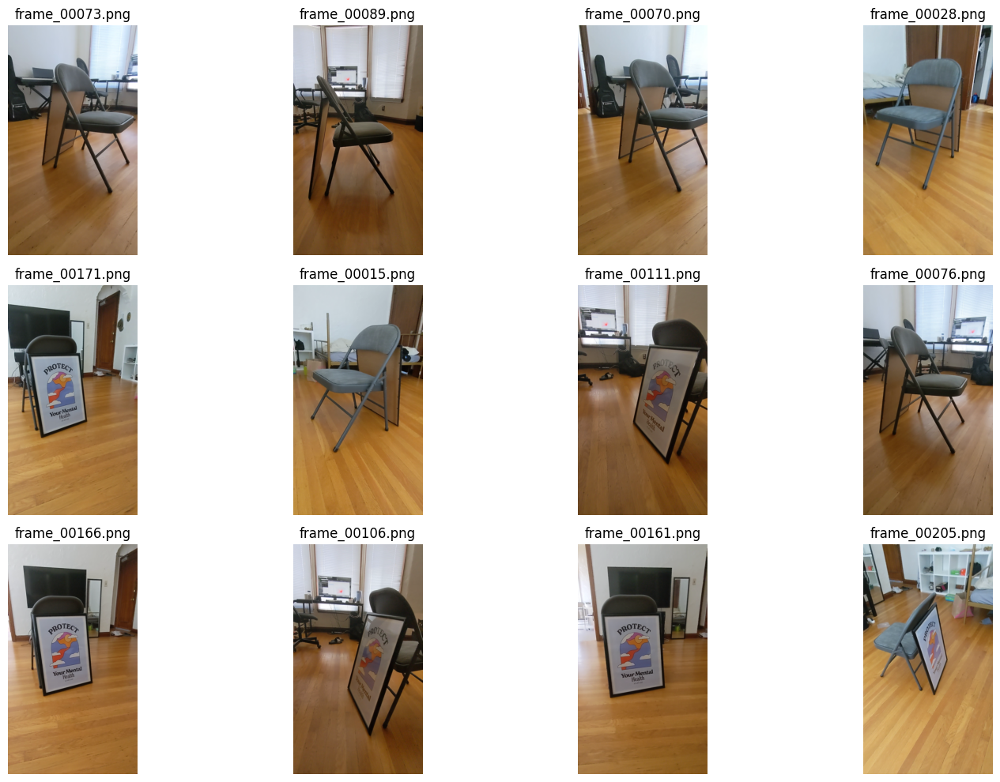

In [ ]:
import random
IMAGE_DIR = "/content/data/nerfstudio_hf/poster/images_4"

image_paths = sorted(glob.glob(IMAGE_DIR + "/*.png"))

print("Количество изображений:", len(image_paths))
print("Первые 5 файлов:")
for p in image_paths[:5]:
    print(p)

sample_paths = random.sample(image_paths, min(12, len(image_paths)))

plt.figure(figsize=(16, 10))

for i, path in enumerate(sample_paths):
    img = Image.open(path)
    plt.subplot(3, 4, i + 1)
    plt.imshow(img)
    plt.title(os.path.basename(path))
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
for path in image_paths[:10]:
    img = Image.open(path)
    print(os.path.basename(path), img.size)

frame_00001.png (270, 480)
frame_00003.png (270, 480)
frame_00004.png (270, 480)
frame_00005.png (270, 480)
frame_00006.png (270, 480)
frame_00007.png (270, 480)
frame_00010.png (270, 480)
frame_00011.png (270, 480)
frame_00012.png (270, 480)
frame_00013.png (270, 480)


In [ ]:
!find /content/data/nerfstudio_hf/poster -maxdepth 2 -type f | grep transforms

/content/data/nerfstudio_hf/poster/transforms.json


In [ ]:
import json

TRANSFORMS_PATH = "/content/data/nerfstudio_hf/poster/transforms.json"

with open(TRANSFORMS_PATH, "r") as f:
    transforms = json.load(f)

print("Ключи:", transforms.keys())
print("Количество кадров:", len(transforms["frames"]))
print("Первый frame:")
transforms["frames"][0]

Ключи: dict_keys(['fl_x', 'fl_y', 'k1', 'k2', 'p1', 'p2', 'cx', 'cy', 'w', 'h', 'aabb_scale', 'frames', 'applied_transform', 'ply_file_path'])
Количество кадров: 226
Первый frame:


{'file_path': './images/frame_00001.png',
 'transform_matrix': [[0.32316911338447335,
   -0.8052290294881217,
   -0.4971598678734143,
   -0.7282161659858809],
  [-0.43978339113907267,
   0.33738608648128665,
   -0.8323227724429142,
   -2.7487404236023076],
  [0.8379452804524355,
   0.48762366505170673,
   -0.24509359079549578,
   -2.1384913608645126],
  [0.0, 0.0, 0.0, 1.0]]}

In [ ]:
from huggingface_hub import snapshot_download

snapshot_download(
    repo_id="nerfstudioteam/datasets",
    repo_type="dataset",
    allow_patterns="dozer/**",
    local_dir="/content/data/nerfstudio_hf",
    local_dir_use_symlinks=False,
)

Fetching ... files: 0it [00:00, ?it/s]

'/content/data/nerfstudio_hf'

In [ ]:
!find /content/data/nerfstudio_hf/dozer -maxdepth 3 -type f | head -30

/content/data/nerfstudio_hf/dozer/images/frame_00332.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00257.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00299.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00172.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00324.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00060.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00325.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00125.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00358.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00237.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00283.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00036.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00128.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00057.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00305.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00328.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00294.jpeg
/content/data/

In [ ]:


SCENE_DIR = "/content/data/nerfstudio_hf/dozer"

# Проверяем возможные папки с изображениями
for folder in ["images", "images_2", "images_4", "images_8"]:
    image_dir = os.path.join(SCENE_DIR, folder)
    image_paths = sorted(
        glob.glob(image_dir + "/*.png") +
        glob.glob(image_dir + "/*.jpg") +
        glob.glob(image_dir + "/*.jpeg")
    )
    if len(image_paths) > 0:
        print(folder, ":", len(image_paths), "изображений")

images : 100 изображений
images_2 : 100 изображений
images_4 : 100 изображений
images_8 : 100 изображений


Папка: /content/data/nerfstudio_hf/dozer/images_4
Количество изображений: 100
Первые 10 файлов:
frame_00001.jpeg
frame_00016.jpeg
frame_00017.jpeg
frame_00020.jpeg
frame_00021.jpeg
frame_00026.jpeg
frame_00030.jpeg
frame_00036.jpeg
frame_00037.jpeg
frame_00040.jpeg


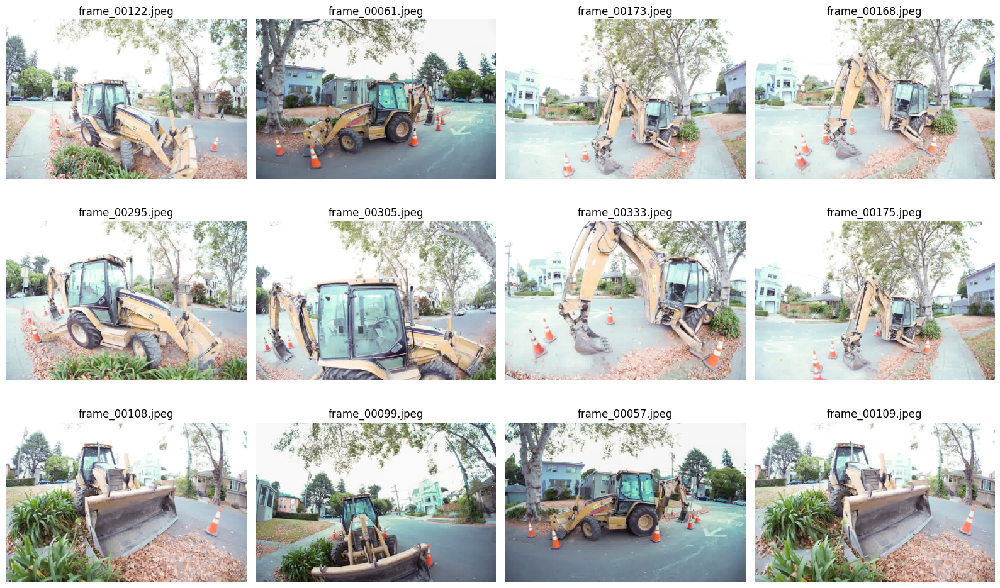

In [ ]:
IMAGE_DIR = "/content/data/nerfstudio_hf/dozer/images_4"

image_paths = []
for ext in ["*.png", "*.jpg", "*.jpeg", "*.JPG", "*.JPEG", "*.PNG"]:
    image_paths.extend(glob.glob(os.path.join(IMAGE_DIR, ext)))

image_paths = sorted(image_paths)

print("Папка:", IMAGE_DIR)
print("Количество изображений:", len(image_paths))
print("Первые 10 файлов:")
for p in image_paths[:10]:
    print(os.path.basename(p))

sample_paths = random.sample(image_paths, min(12, len(image_paths)))

plt.figure(figsize=(16, 10))
for i, path in enumerate(sample_paths):
    img = Image.open(path)
    plt.subplot(3, 4, i + 1)
    plt.imshow(img)
    plt.title(os.path.basename(path))
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:

SCENE_DIR = "/content/data/nerfstudio_hf/dozer"
TRANSFORMS_PATH = os.path.join(SCENE_DIR, "transforms.json")

print("transforms.json exists:", os.path.exists(TRANSFORMS_PATH))

with open(TRANSFORMS_PATH, "r") as f:
    transforms = json.load(f)

print("Ключи transforms.json:")
print(transforms.keys())

print("\nКоличество кадров:", len(transforms["frames"]))

print("\nПервый frame:")
transforms["frames"][0]

transforms.json exists: True
Ключи transforms.json:
dict_keys(['fl_x', 'fl_y', 'cx', 'cy', 'w', 'h', 'camera_model', 'k1', 'k2', 'k3', 'k4', 'frames'])

Количество кадров: 359

Первый frame:


{'file_path': 'images/frame_00001.jpeg',
 'transform_matrix': [[0.00016753952732824387,
   -0.9810406599026638,
   -0.1938019492890949,
   0.637837674052381],
  [0.9465183284705816,
   -0.062374629004221555,
   0.3165635157844977,
   1.467212758546972],
  [-0.3226500051135332,
   -0.18349013399725841,
   0.9285625153568848,
   5.410412003957261],
  [0.0, 0.0, 0.0, 1.0]]}

In [ ]:
for i in range(5):
    print(transforms["frames"][i]["file_path"])

images/frame_00001.jpeg
images/frame_00002.jpeg
images/frame_00004.jpeg
images/frame_00005.jpeg
images/frame_00003.jpeg


In [ ]:
SCENE_DIR = "/content/data/nerfstudio_hf/dozer"
TRANSFORMS_PATH = os.path.join(SCENE_DIR, "transforms.json")

print("transforms.json exists:", os.path.exists(TRANSFORMS_PATH))

with open(TRANSFORMS_PATH, "r") as f:
    transforms = json.load(f)

print("Ключи:")
print(transforms.keys())

print("\nКоличество frames:", len(transforms["frames"]))

print("\nПервый frame:")
print(transforms["frames"][0])

transforms.json exists: True
Ключи:
dict_keys(['fl_x', 'fl_y', 'cx', 'cy', 'w', 'h', 'camera_model', 'k1', 'k2', 'k3', 'k4', 'frames'])

Количество frames: 359

Первый frame:
{'file_path': 'images/frame_00001.jpeg', 'transform_matrix': [[0.00016753952732824387, -0.9810406599026638, -0.1938019492890949, 0.637837674052381], [0.9465183284705816, -0.062374629004221555, 0.3165635157844977, 1.467212758546972], [-0.3226500051135332, -0.18349013399725841, 0.9285625153568848, 5.410412003957261], [0.0, 0.0, 0.0, 1.0]]}


In [ ]:
print("Первые 10 file_path из transforms.json:")

for i in range(10):
    print(transforms["frames"][i]["file_path"])

Первые 10 file_path из transforms.json:
images/frame_00001.jpeg
images/frame_00002.jpeg
images/frame_00004.jpeg
images/frame_00005.jpeg
images/frame_00003.jpeg
images/frame_00006.jpeg
images/frame_00007.jpeg
images/frame_00008.jpeg
images/frame_00009.jpeg
images/frame_00010.jpeg


In [ ]:
missing = []

for frame in transforms["frames"]:
    path = os.path.join(SCENE_DIR, frame["file_path"])
    if not os.path.exists(path):
        missing.append(path)

print("Всего frames:", len(transforms["frames"]))
print("Не найдено файлов:", len(missing))

if missing:
    print("Первые отсутствующие:")
    for p in missing[:10]:
        print(p)
else:
    print("Все изображения из transforms.json найдены.")

Всего frames: 359
Не найдено файлов: 259
Первые отсутствующие:
/content/data/nerfstudio_hf/dozer/images/frame_00002.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00004.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00005.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00003.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00006.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00007.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00008.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00009.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00010.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00011.jpeg


In [ ]:
!find /content/data/nerfstudio_hf/dozer/images -maxdepth 1 -type f | head -30

/content/data/nerfstudio_hf/dozer/images/frame_00332.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00257.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00299.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00172.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00324.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00060.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00325.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00125.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00358.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00237.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00283.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00036.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00128.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00057.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00305.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00328.jpeg
/content/data/nerfstudio_hf/dozer/images/frame_00294.jpeg
/content/data/

In [ ]:
!find /content/data/nerfstudio_hf/dozer/images_4 -maxdepth 1 -type f | head -30

/content/data/nerfstudio_hf/dozer/images_4/frame_00332.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00257.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00299.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00172.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00324.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00060.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00325.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00125.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00358.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00237.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00283.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00036.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00128.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00057.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00305.jpeg
/content/data/nerfstudio_hf/dozer/images_4/frame_00328.jpeg
/content/data/nerfstudio_hf/dozer/images

In [ ]:
SCENE_DIR = "/content/data/nerfstudio_hf/dozer"

for folder in ["images", "images_2", "images_4", "images_8"]:
    folder_path = os.path.join(SCENE_DIR, folder)
    files = []
    for ext in ["*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"]:
        files.extend(glob.glob(os.path.join(folder_path, ext)))
    print(folder, len(files))

images 100
images_2 100
images_4 100
images_8 100


In [ ]:
for i in range(20):
    print(transforms["frames"][i]["file_path"])

images/frame_00001.jpeg
images/frame_00002.jpeg
images/frame_00004.jpeg
images/frame_00005.jpeg
images/frame_00003.jpeg
images/frame_00006.jpeg
images/frame_00007.jpeg
images/frame_00008.jpeg
images/frame_00009.jpeg
images/frame_00010.jpeg
images/frame_00011.jpeg
images/frame_00012.jpeg
images/frame_00014.jpeg
images/frame_00013.jpeg
images/frame_00015.jpeg
images/frame_00016.jpeg
images/frame_00018.jpeg
images/frame_00017.jpeg
images/frame_00020.jpeg
images/frame_00019.jpeg


In [ ]:
import shutil
from pathlib import Path

SRC_SCENE_DIR = Path("/content/data/nerfstudio_hf/dozer")
DST_SCENE_DIR = Path("/content/data/nerfstudio_hf/dozer_100")


if DST_SCENE_DIR.exists():
    shutil.rmtree(DST_SCENE_DIR)

DST_SCENE_DIR.mkdir(parents=True, exist_ok=True)


for folder in ["images", "images_2", "images_4", "images_8"]:
    src_folder = SRC_SCENE_DIR / folder
    dst_folder = DST_SCENE_DIR / folder

    if src_folder.exists():
        shutil.copytree(src_folder, dst_folder)

with open(SRC_SCENE_DIR / "transforms.json", "r") as f:
    transforms = json.load(f)

filtered_frames = []

for frame in transforms["frames"]:
    image_path = SRC_SCENE_DIR / frame["file_path"]
    if image_path.exists():
        filtered_frames.append(frame)

print("Было frames:", len(transforms["frames"]))
print("Осталось frames:", len(filtered_frames))

new_transforms = dict(transforms)
new_transforms["frames"] = filtered_frames

with open(DST_SCENE_DIR / "transforms.json", "w") as f:
    json.dump(new_transforms, f, indent=2)

print("Готово:", DST_SCENE_DIR)

Было frames: 359
Осталось frames: 100
Готово: /content/data/nerfstudio_hf/dozer_100


In [ ]:
SCENE_DIR = Path("/content/data/nerfstudio_hf/dozer_100")

with open(SCENE_DIR / "transforms.json", "r") as f:
    transforms_100 = json.load(f)

missing = []

for frame in transforms_100["frames"]:
    path = SCENE_DIR / frame["file_path"]
    if not path.exists():
        missing.append(path)

print("Frames в новом transforms:", len(transforms_100["frames"]))
print("Не найдено файлов:", len(missing))

if missing:
    print("Первые отсутствующие:")
    for p in missing[:10]:
        print(p)
else:
    print("Все изображения найдены.")

Frames в новом transforms: 100
Не найдено файлов: 0
Все изображения найдены.


In [ ]:
!ns-train splatfacto \
  --data /content/data/nerfstudio_hf/dozer_100 \
  --max-num-iterations 1000 \
  --viewer.quit-on-train-completion True

2026-05-11 19:24:45.585338: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:32: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @custom_fwd(cast_inputs=torch.float32)
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:38: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  @custom_bwd
[19:24:58] Using --data alias for --data.pipeline.datamanager.data                                          ]8;id=689134;file:///usr/local/lib/python3.12/dist-packages/nerf

In [ ]:
!nvidia-smi

Mon May 11 19:27:50 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   50C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!find /content/outputs -maxdepth 5 -type f -name "config.yml"

/content/outputs/dozer_100/splatfacto/2026-05-11_192458/config.yml


In [ ]:
!ls -R /content/outputs | head -100

/content/outputs:
dozer_100

/content/outputs/dozer_100:
splatfacto

/content/outputs/dozer_100/splatfacto:
2026-05-11_192458

/content/outputs/dozer_100/splatfacto/2026-05-11_192458:
config.yml
dataparser_transforms.json


In [ ]:
!find /content/outputs/dozer_100/splatfacto/2026-05-11_130651 -type f

find: ‘/content/outputs/dozer_100/splatfacto/2026-05-11_130651’: No such file or directory


In [ ]:
CONFIG_PATH = "/content/outputs/dozer_100/splatfacto/2026-05-11_130651/config.yml"
print(CONFIG_PATH)

/content/outputs/dozer_100/splatfacto/2026-05-11_130651/config.yml


In [ ]:
!ns-train splatfacto \
  --data /content/data/nerfstudio_hf/dozer_100 \
  --max-num-iterations 500 \
  --steps-per-save 250 \
  --viewer.quit-on-train-completion True

Выходные данные были обрезаны до нескольких последних строк (5000).
( ●    ) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
(●     ) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
( ●    ) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
(  ●   ) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
(   ●  ) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
(    ● ) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
(     ●) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
(   ●  ) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
(  ●   ) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
( ●    ) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
(●     ) gsplat: Setting up CUDA with MAX_JOBS=10 (This may take a few minutes 
( ●    ) gsplat: Setting up CUDA with MAX_JOBS=10 (T

In [ ]:
!nvidia-smi

Mon May 11 19:41:46 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   65C    P0             29W /   70W |       0MiB /  15360MiB |     11%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!find /content/outputs/dozer_100/splatfacto/2026-05-11_131302 -type f

find: ‘/content/outputs/dozer_100/splatfacto/2026-05-11_131302’: No such file or directory


In [ ]:
!ps aux | grep -E "ns-train|python" | grep -v grep

root          64  0.9  0.0      0     0 ?        Z    19:17   0:14 [python3] <defunct>
root          65  0.1  0.4  99500 58228 ?        S    19:17   0:02 python3 /usr/local/bin/colab-fileshim.py
root         112  0.7  0.9 416172 132844 ?       Sl   19:17   0:10 /usr/bin/python3 /usr/local/bin/jupyter-server --debug --transport="ipc" --ip=172.28.0.12 --ServerApp.token= --port=9000 --FileContentsManager.root_dir=/ --FileContentsManager.allow_hidden=True --ServerApp.log_format="|%(levelname)s|%(message)s" --ServerApp.iopub_data_rate_limit=1e10 --MappingKernelManager.root_dir=/content
root         555  2.7  1.6 1476620 215308 ?      Ssl  19:19   0:37 /usr/bin/python3 -m colab_kernel_launcher -f /root/.local/share/jupyter/runtime/kernel-e6ff6f65-88f4-41fc-860f-2226202d8fe2.json


In [ ]:
!find /content/outputs/dozer_100/splatfacto/2026-05-11_131302 -type f | sort

find: ‘/content/outputs/dozer_100/splatfacto/2026-05-11_131302’: No such file or directory


In [ ]:
!find /content/outputs -type f | grep -E "ckpt|pt|pth|model|ply" | sort

In [ ]:
!du -sh /content/outputs/dozer_100/splatfacto/2026-05-11_131302

du: cannot access '/content/outputs/dozer_100/splatfacto/2026-05-11_131302': No such file or directory


In [ ]:
%%bash
set -o pipefail

ns-train splatfacto \
  --data /content/data/nerfstudio_hf/dozer_100 \
  --max-num-iterations 20 \
  --steps-per-save 10 \
  --vis tensorboard \
  2>&1 | tee /content/ns_train_debug.log

echo "EXIT_CODE=${PIPESTATUS[0]}"

2026-05-11 19:41:55.288681: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:32: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @custom_fwd(cast_inputs=torch.float32)
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:38: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  @custom_bwd
[19:42:02] Using --data alias for --data.pipeline.datamanager.data                                          train.py:230
────────────────────────────────────────────────────

In [ ]:
!rm -rf /root/.cache/torch_extensions

In [ ]:
import os

os.environ["MAX_JOBS"] = "1"
os.environ["TORCH_EXTENSIONS_DIR"] = "/content/torch_extensions"

print("MAX_JOBS =", os.environ["MAX_JOBS"])
print("TORCH_EXTENSIONS_DIR =", os.environ["TORCH_EXTENSIONS_DIR"])

MAX_JOBS = 1
TORCH_EXTENSIONS_DIR = /content/torch_extensions


In [ ]:
!MAX_JOBS=1 TORCH_EXTENSIONS_DIR=/content/torch_extensions ns-train splatfacto \
  --data /content/data/nerfstudio_hf/dozer_100 \
  --max-num-iterations 20 \
  --steps-per-save 10 \
  --vis tensorboard

Выходные данные были обрезаны до нескольких последних строк (5000).
(   ●  ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
(  ●   ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
( ●    ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
(●     ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
( ●    ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
(  ●   ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
(   ●  ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
(    ● ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
(     ●) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
(    ● ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
(   ●  ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take a few minutes 
(  ●   ) gsplat: Setting up CUDA with MAX_JOBS=1 (This may take

In [ ]:
!find /content/outputs/dozer_100/splatfacto -type f | grep ckpt

/content/outputs/dozer_100/splatfacto/2026-05-11_194953/nerfstudio_models/step-000000019.ckpt


In [ ]:
!MAX_JOBS=1 TORCH_EXTENSIONS_DIR=/content/torch_extensions ns-train splatfacto \
  --data /content/data/nerfstudio_hf/dozer_100 \
  --max-num-iterations 3000 \
  --steps-per-save 1000 \
  --vis tensorboard \
  --viewer.quit-on-train-completion True

2026-05-11 20:29:35.577344: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:32: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @custom_fwd(cast_inputs=torch.float32)
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:38: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  @custom_bwd
[20:29:41] Using --data alias for --data.pipeline.datamanager.data                                          ]8;id=617116;file:///usr/local/lib/python3.12/dist-packages/nerf

In [ ]:
!find /content/outputs/dozer_100/splatfacto -type f | grep ckpt | sort

/content/outputs/dozer_100/splatfacto/2026-05-11_194953/nerfstudio_models/step-000000019.ckpt
/content/outputs/dozer_100/splatfacto/2026-05-11_202941/nerfstudio_models/step-000002999.ckpt


In [ ]:
CONFIG_PATH = "/content/outputs/dozer_100/splatfacto/2026-05-11_143405/config.yml"
print(CONFIG_PATH)

!ls -lah /content/outputs/dozer_100/splatfacto/2026-05-11_143405

/content/outputs/dozer_100/splatfacto/2026-05-11_143405/config.yml
ls: cannot access '/content/outputs/dozer_100/splatfacto/2026-05-11_143405': No such file or directory


In [ ]:
!ns-render --help

2026-05-11 20:32:11.275931: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:32: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @custom_fwd(cast_inputs=torch.float32)
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:38: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  @custom_bwd
usage: /usr/local/bin/ns-render [-h] {camera-path,interpolate,spiral,dataset}

╭─ options ────────────────────────────────────────────────────────────────────╮
│ -h, --help 

In [ ]:
CONFIG_PATH = "/content/outputs/dozer_100/splatfacto/2026-05-11_143405/config.yml"

!ns-render interpolate \
  --load-config $CONFIG_PATH \
  --output-path /content/dozer_interpolate.mp4

2026-05-11 20:32:23.040914: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:32: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @custom_fwd(cast_inputs=torch.float32)
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:38: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  @custom_bwd
Traceback (most recent call last):
  File "/usr/local/bin/ns-render", line 6, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3

In [ ]:
!ls -lh /content/dozer_interpolate.mp4

ls: cannot access '/content/dozer_interpolate.mp4': No such file or directory


In [ ]:
from IPython.display import Video

Video("/content/dozer_interpolate.mp4", embed=True)

In [ ]:
!ps aux | grep -E "ns-render|python" | grep -v grep

root          64  0.3  0.0      0     0 ?        Z    19:17   0:14 [python3] <defunct>
root          65  0.0  0.4  99500 58220 ?        S    19:17   0:02 python3 /usr/local/bin/colab-fileshim.py
root         112  0.5  1.0 416172 132964 ?       Sl   19:17   0:23 /usr/bin/python3 /usr/local/bin/jupyter-server --debug --transport="ipc" --ip=172.28.0.12 --ServerApp.token= --port=9000 --FileContentsManager.root_dir=/ --FileContentsManager.allow_hidden=True --ServerApp.log_format="|%(levelname)s|%(message)s" --ServerApp.iopub_data_rate_limit=1e10 --MappingKernelManager.root_dir=/content
root         555  1.2  1.8 1516012 249824 ?      Ssl  19:19   0:53 /usr/bin/python3 -m colab_kernel_launcher -f /root/.local/share/jupyter/runtime/kernel-e6ff6f65-88f4-41fc-860f-2226202d8fe2.json


In [ ]:
!find /content -type f | grep -E "\.mp4$" | sort

In [ ]:
%%bash
set -o pipefail

ns-render interpolate \
  --load-config /content/outputs/dozer_100/splatfacto/2026-05-11_143405/config.yml \
  --output-path /content/dozer_interpolate.mp4 \
  2>&1 | tee /content/ns_render.log

echo "EXIT_CODE=${PIPESTATUS[0]}"

2026-05-11 20:32:35.075237: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:32: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @custom_fwd(cast_inputs=torch.float32)
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:38: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  @custom_bwd
Traceback (most recent call last):
  File "/usr/local/bin/ns-render", line 6, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3

In [ ]:
%%bash
set -o pipefail

TORCH_FORCE_NO_WEIGHTS_ONLY_LOAD=1 \
MAX_JOBS=1 \
TORCH_EXTENSIONS_DIR=/content/torch_extensions \
ns-render interpolate \
  --load-config /content/outputs/dozer_100/splatfacto/2026-05-11_143405/config.yml \
  --output-path /content/dozer_interpolate.mp4 \
  2>&1 | tee /content/ns_render_fixed.log

echo "EXIT_CODE=${PIPESTATUS[0]}"

2026-05-11 20:32:46.667623: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:32: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @custom_fwd(cast_inputs=torch.float32)
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:38: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  @custom_bwd
Traceback (most recent call last):
  File "/usr/local/bin/ns-render", line 6, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3

In [ ]:
from IPython.display import Video

Video("/content/dozer_interpolate.mp4", embed=True)

In [ ]:
!ns-train --help | grep splatfacto

2026-05-11 20:32:57.089356: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:32: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @custom_fwd(cast_inputs=torch.float32)
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:38: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  @custom_bwd
usage: /usr/local/bin/ns-train [-h] {depth-nerfacto,dnerf,generfacto,instant-ngp,instant-ngp-bounded,mipnerf,nerfacto,nerfacto-big,nerfacto-huge,neus,neus-facto,phototourism

In [ ]:
!MAX_JOBS=1 TORCH_EXTENSIONS_DIR=/content/torch_extensions ns-train splatfacto-big \
  --data /content/data/nerfstudio_hf/dozer_100 \
  --max-num-iterations 10000 \
  --steps-per-save 2500 \
  --vis tensorboard \
  --viewer.quit-on-train-completion True

Выходные данные были обрезаны до нескольких последних строк (5000).
5890 (58.90%)       85.260 ms            5 m, 50 s            17.67 M                                    
5900 (59.00%)       86.870 ms            5 m, 56 s            17.61 M              20.58 M               
5910 (59.10%)       121.031 ms           8 m, 15 s            17.09 M                                    
Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
5830 (58.30%)       84.254 ms            5 m, 51 s            17.87 M                                    
5840 (58.40%)       83.915 ms            5 m, 49 s            17.94 M                                    
5850 (58.50%)       83.924 ms            5 m, 48 s            17.94 M                                    
5860 (58.60%)       85.162 ms            5 m, 52 s            17.69 M               

In [ ]:


configs = sorted(
    glob.glob("/content/outputs/dozer_100/**/config.yml", recursive=True),
    key=os.path.getmtime
)

print("Найденные config:")
for c in configs:
    print(c)

LATEST_CONFIG = configs[-1]
print("\nПоследний config:")
print(LATEST_CONFIG)

Найденные config:
/content/outputs/dozer_100/splatfacto/2026-05-11_192458/config.yml
/content/outputs/dozer_100/splatfacto/2026-05-11_192904/config.yml
/content/outputs/dozer_100/splatfacto/2026-05-11_194202/config.yml
/content/outputs/dozer_100/splatfacto/2026-05-11_194953/config.yml
/content/outputs/dozer_100/splatfacto/2026-05-11_202941/config.yml
/content/outputs/dozer_100/splatfacto/2026-05-11_203312/config.yml

Последний config:
/content/outputs/dozer_100/splatfacto/2026-05-11_203312/config.yml


In [ ]:
run_dir = os.path.dirname(LATEST_CONFIG)

ckpts = sorted(
    glob.glob(os.path.join(run_dir, "nerfstudio_models", "*.ckpt")),
    key=os.path.getmtime
)

print("Run dir:", run_dir)
print("Checkpoints:")
for c in ckpts:
    print(c)

print("\nПоследний checkpoint:")
print(ckpts[-1] if ckpts else "checkpoint не найден")

Run dir: /content/outputs/dozer_100/splatfacto/2026-05-11_203312
Checkpoints:
/content/outputs/dozer_100/splatfacto/2026-05-11_203312/nerfstudio_models/step-000009999.ckpt

Последний checkpoint:
/content/outputs/dozer_100/splatfacto/2026-05-11_203312/nerfstudio_models/step-000009999.ckpt


In [ ]:
%%bash
set -o pipefail

TORCH_FORCE_NO_WEIGHTS_ONLY_LOAD=1 \
MAX_JOBS=1 \
TORCH_EXTENSIONS_DIR=/content/torch_extensions \
ns-render interpolate \
  --load-config "$(python - <<'PY'
import glob, os
configs = sorted(glob.glob("/content/outputs/dozer_100/**/config.yml", recursive=True), key=os.path.getmtime)
print(configs[-1])
PY
)" \
  --output-path /content/dozer_big_interpolate.mp4 \
  2>&1 | tee /content/ns_render_big.log

echo "EXIT_CODE=${PIPESTATUS[0]}"

2026-05-11 20:52:42.405953: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:32: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @custom_fwd(cast_inputs=torch.float32)
/usr/local/lib/python3.12/dist-packages/nerfstudio/field_components/activations.py:38: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  @custom_bwd
[20:52:49] Auto image downscale factor of 2                                                 nerfstudio_dataparser.py:484
/usr/local/lib/python3.12/dist-packages/torchmetrics

In [ ]:
from IPython.display import Video

Video("/content/dozer_big_interpolate.mp4", embed=True)